In [1]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sb
import re, os, string

%matplotlib inline

## Loading Data

In [3]:
## Loading cleaned data
train = pd.read_csv('../data/train_cleaned.csv')
test = pd.read_csv('../data/test_cleaned.csv')

FileNotFoundError: [Errno 2] No such file or directory: '../data/train_cleaned.csv'

In [ ]:
train.info()

In [ ]:
train.describe()
##notihng captured in title polarity

In [ ]:
test.describe()
##notihng captured in title polarity

In [ ]:
## Replacing null string in NaN, to treat them as string not float
train = train.replace(np.nan, '', regex=True)
test = test.replace(np.nan, '', regex=True)

## Analyzing Patterns and Structure of Data

In [8]:
## Checking more frequent authors names and sources
import collections

def sortFreqDict(freqdict):
    aux = [(freqdict[key], key) for key in freqdict]
    aux.sort()
    aux.reverse()
    return aux

elements_count = collections.Counter(' '.join(train.author).split())
elements_count = sortFreqDict(elements_count)

In [9]:
elements_count

[(1545, 'and'),
 (493, 'michael'),
 (425, 'the'),
 (406, 'john'),
 (352, 'breitbart'),
 (318, 'noreplybloggercom'),
 (269, 'daniel'),
 (269, 'charlie'),
 (269, 'admin'),
 (258, 'david'),
 (256, 'pam'),
 (243, 'key'),
 (215, 'news'),
 (210, 'd'),
 (196, 'ian'),
 (183, 'ben'),
 (173, 'mike'),
 (172, 'hudson'),
 (171, 'jerome'),
 (168, 'baker'),
 (164, 'patrick'),
 (164, 'james'),
 (160, 'robert'),
 (159, 'j'),
 (158, 'andrew'),
 (157, 'eric'),
 (154, 'neil'),
 (149, 'author'),
 (147, 'jason'),
 (147, 'b'),
 (147, 'alan'),
 (145, 'thomas'),
 (142, 'hayward'),
 (142, 'alexander'),
 (141, 'stevenson'),
 (141, 'spiering'),
 (141, 'maggie'),
 (140, 'haberman'),
 (136, 'w'),
 (134, 'adam'),
 (132, 'anonymous'),
 (130, 'e'),
 (129, 'sandra'),
 (129, 'katherine'),
 (124, 'todd'),
 (124, 'rodriguez'),
 (124, 'richard'),
 (124, 'dr'),
 (124, 'bob'),
 (124, 'alex'),
 (122, 'warner'),
 (122, 'huston'),
 (121, 'smith'),
 (120, 'times'),
 (120, 'dan'),
 (120, 'amy'),
 (119, 'hanchett'),
 (119, 'dave')

In [10]:
elements_count = collections.Counter(' '.join(test.author).split())
elements_count = sortFreqDict(elements_count)
elements_count
## top authors are similar

[(377, 'and'),
 (128, 'michael'),
 (124, 'the'),
 (90, 'john'),
 (89, 'noreplybloggercom'),
 (86, 'breitbart'),
 (76, 'charlie'),
 (73, 'admin'),
 (70, 'pam'),
 (70, 'david'),
 (66, 'daniel'),
 (65, 'key'),
 (58, 'news'),
 (58, 'jerome'),
 (57, 'hudson'),
 (52, 'd'),
 (50, 'neil'),
 (50, 'eric'),
 (50, 'ben'),
 (48, 'ian'),
 (46, 'thomas'),
 (43, 'mike'),
 (41, 'patrick'),
 (39, 'robert'),
 (38, 'spiering'),
 (38, 'maggie'),
 (38, 'haberman'),
 (38, 'baker'),
 (38, 'adam'),
 (37, 'dr'),
 (36, 'staff'),
 (36, 'b'),
 (36, 'andrew'),
 (35, 'todd'),
 (34, 'smith'),
 (34, 'nussbaum'),
 (34, 'katherine'),
 (34, 'james'),
 (34, 'alexander'),
 (33, 'warner'),
 (33, 'rodriguez'),
 (33, 'huston'),
 (33, 'author'),
 (32, 'stevenson'),
 (32, 'karen'),
 (31, 'times'),
 (31, 'joel'),
 (31, 'jack'),
 (31, 'dave'),
 (31, 'chris'),
 (30, 'w'),
 (30, 'tom'),
 (30, 'scott'),
 (30, 'richard'),
 (30, 'pollak'),
 (30, 'matthew'),
 (30, 'j'),
 (29, 'nash'),
 (29, 'jonathan'),
 (29, 'hawkins'),
 (29, 'awr'),


In [49]:
## WordCloud Function
from wordcloud import WordCloud, STOPWORDS
import matplotlib

def create_wordcloud(data):
    wordcloud = WordCloud(width = 3000, height = 2000, random_state=1, max_words = 400, background_color='white', stopwords = STOPWORDS, colormap=matplotlib.cm.inferno, collocations=False).generate(data)
    plt.figure(figsize=(40, 30))
    plt.imshow(wordcloud) 
    plt.axis("off")

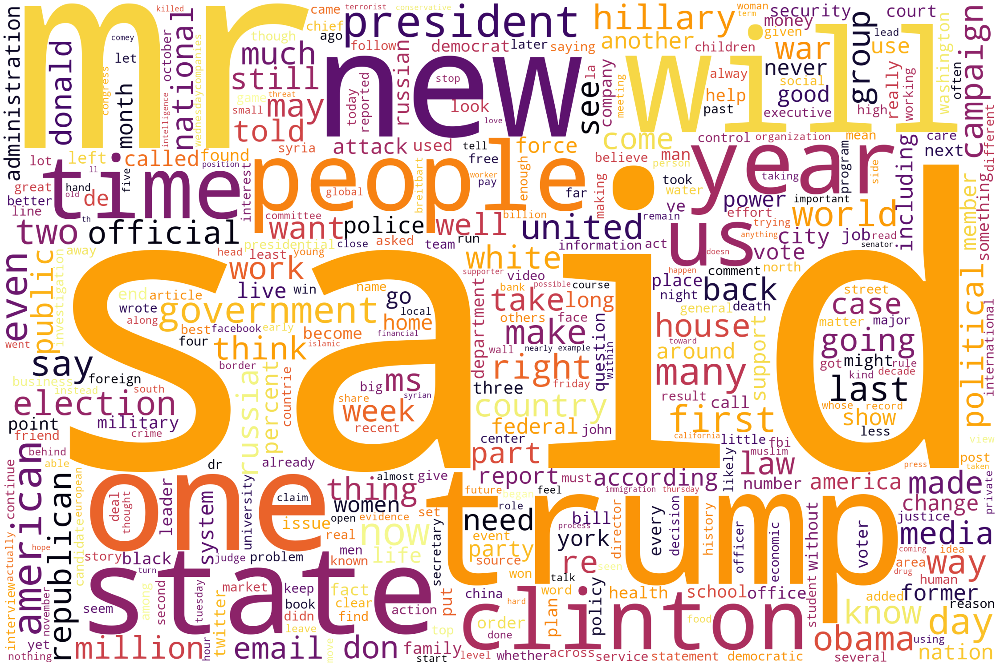

In [32]:
text_train = ' '.join(train.text)
create_wordcloud(text_train)

(-0.5, 2999.5, 1999.5, -0.5)

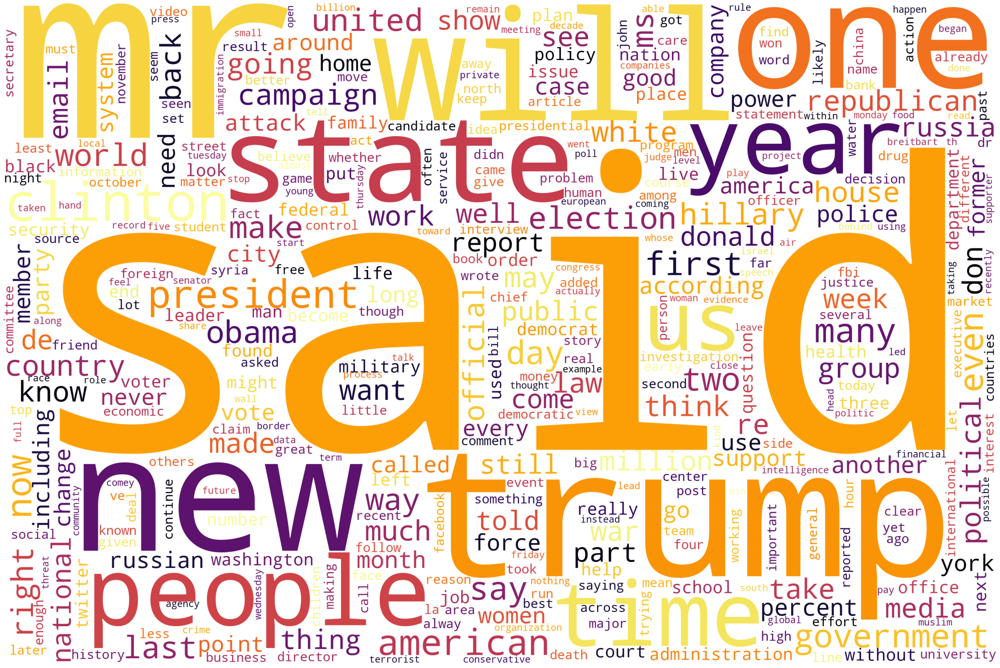

In [38]:
test_text = ' '.join(test.text)
create_wordcloud(test_text)

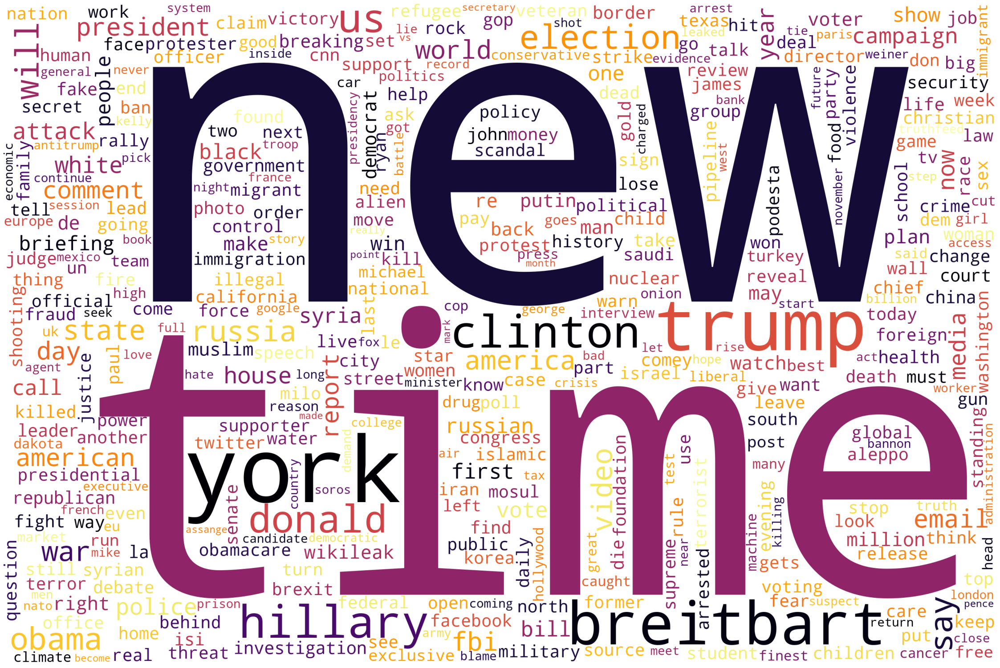

In [40]:
train_title = ' '.join(train.title)
create_wordcloud(train_title)

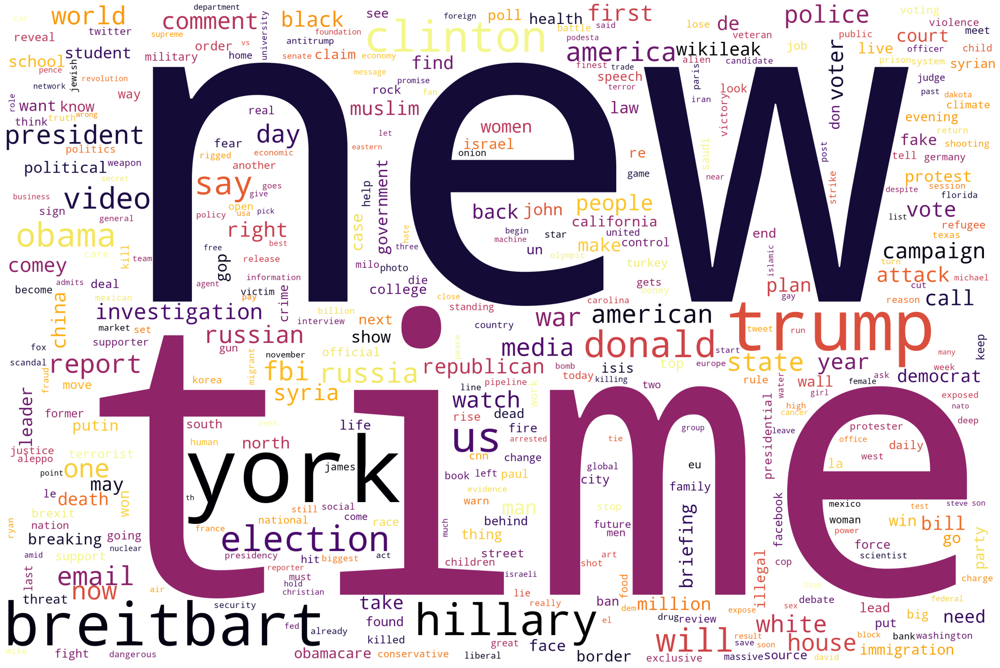

In [41]:
test_title = ' '.join(test.title)
create_wordcloud(test_title)

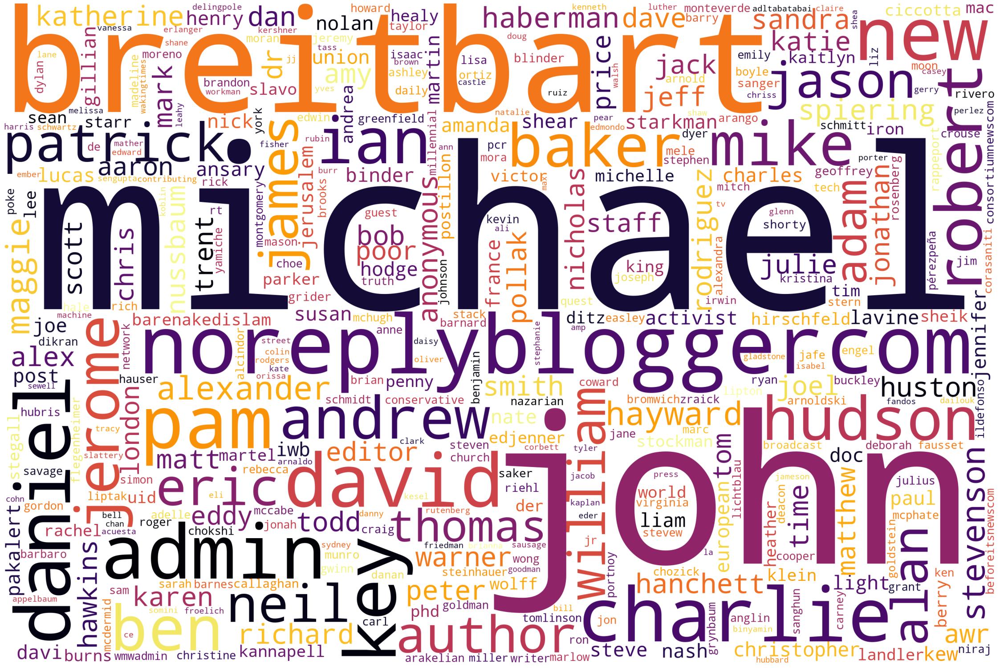

In [42]:
train_author = ' '.join(train.author)
create_wordcloud(train_author)

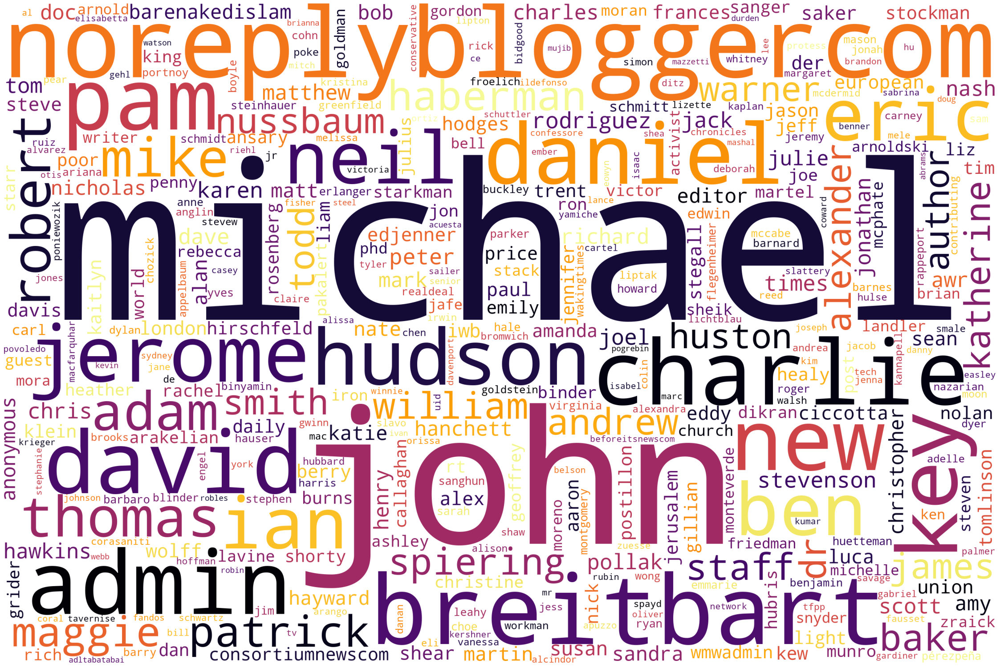

In [43]:
test_author = ' '.join(test.author)
create_wordcloud(test_author)

In [91]:
## Getting column names
cols = train.columns

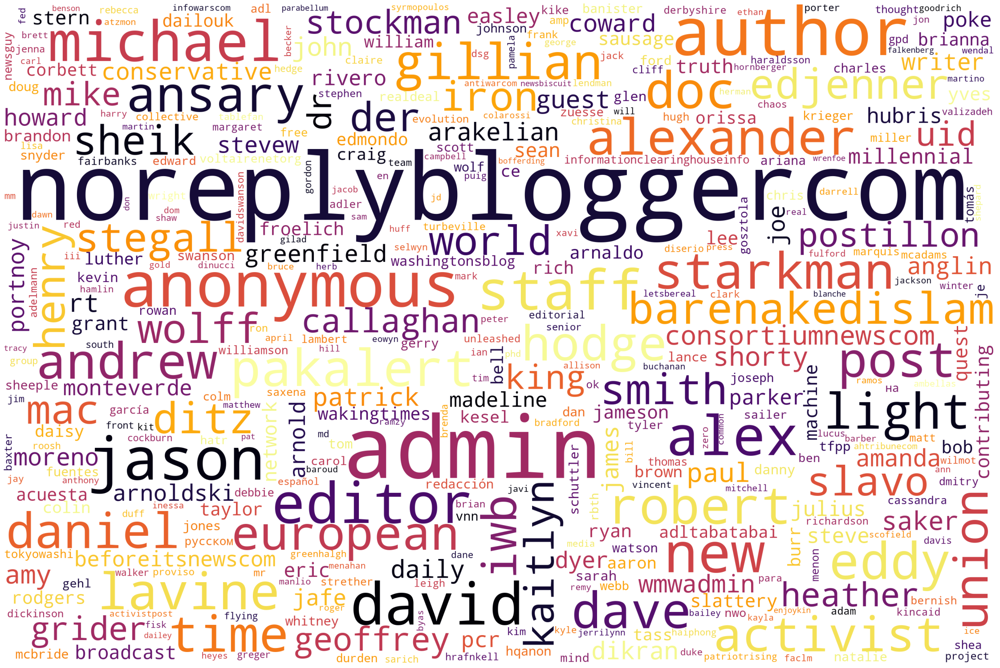

In [50]:
## Seeing if fake news authors and real news authors are same/different
train_author_fn = ' '.join(train[train.label == 1].author)
create_wordcloud(train_author_fn)

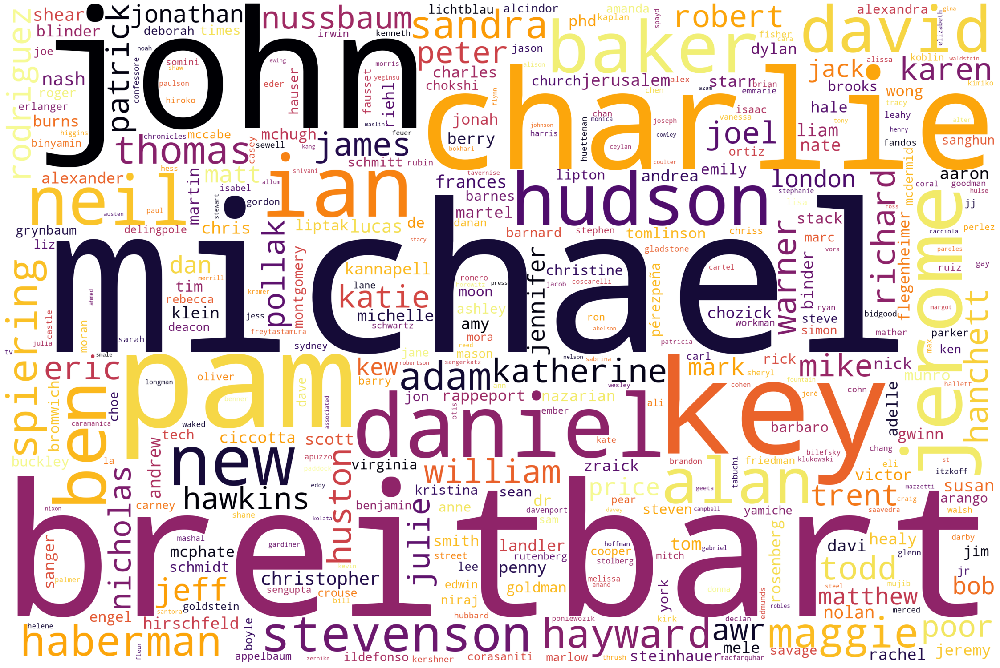

In [51]:
## Seeing if fake news authors and real news authors are same/different
train_author_rn = ' '.join(train[train.label == 0].author)
create_wordcloud(train_author_rn)

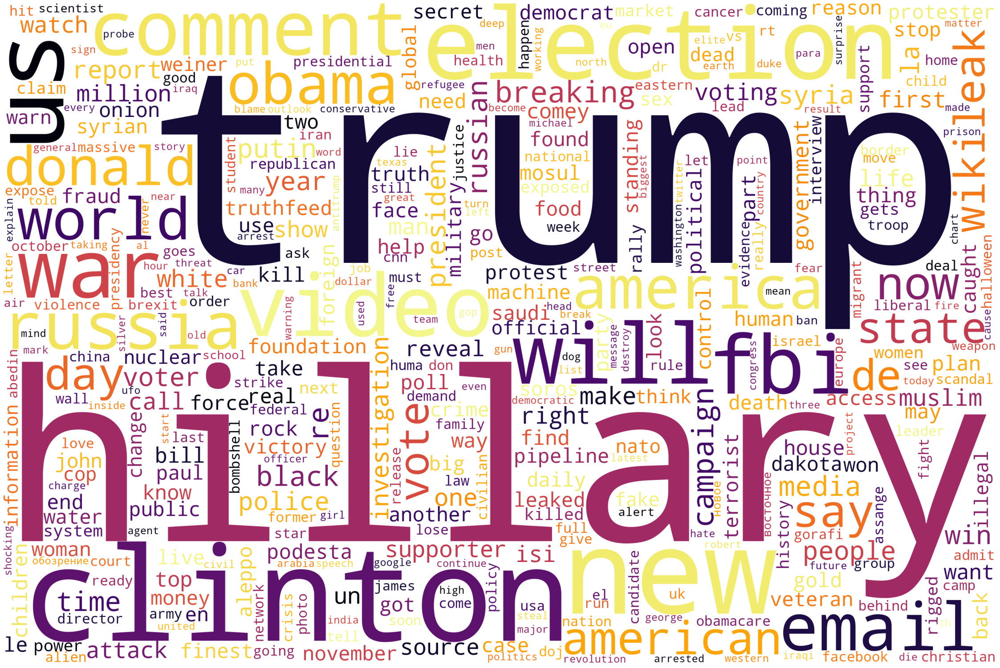

In [53]:
## Seeing if fake news titles and real news titles are same/different
train_title_fn = ' '.join(train[train.label == 1].title)
create_wordcloud(train_title_fn)

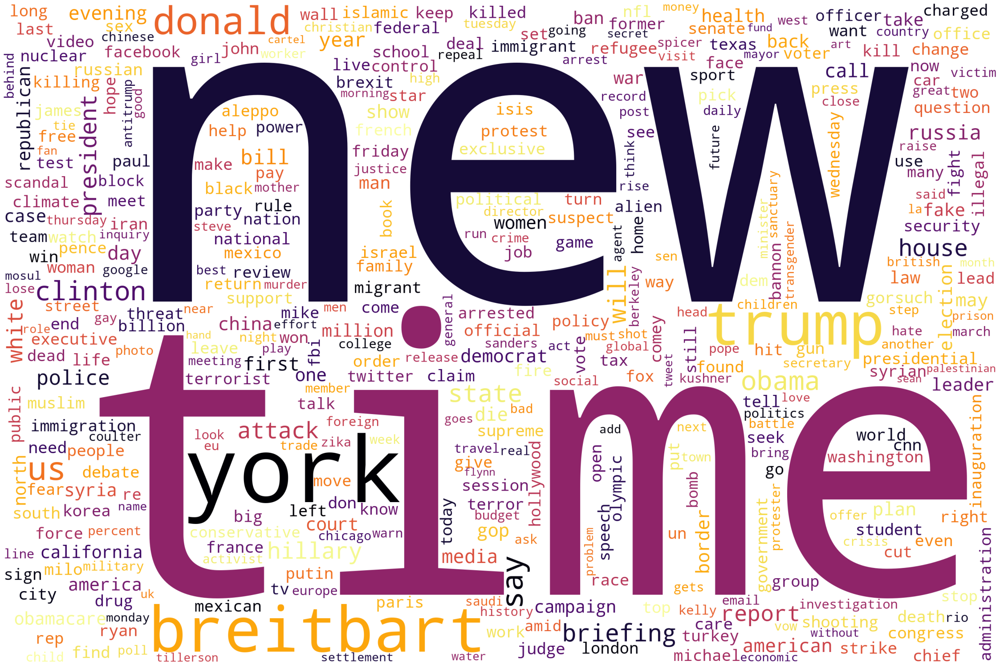

In [52]:
## Seeing if fake news titles and real news titles are same/different
train_title_rn = ' '.join(train[train.label == 0].title)
create_wordcloud(train_title_rn)

## Visualizing data and Correlations

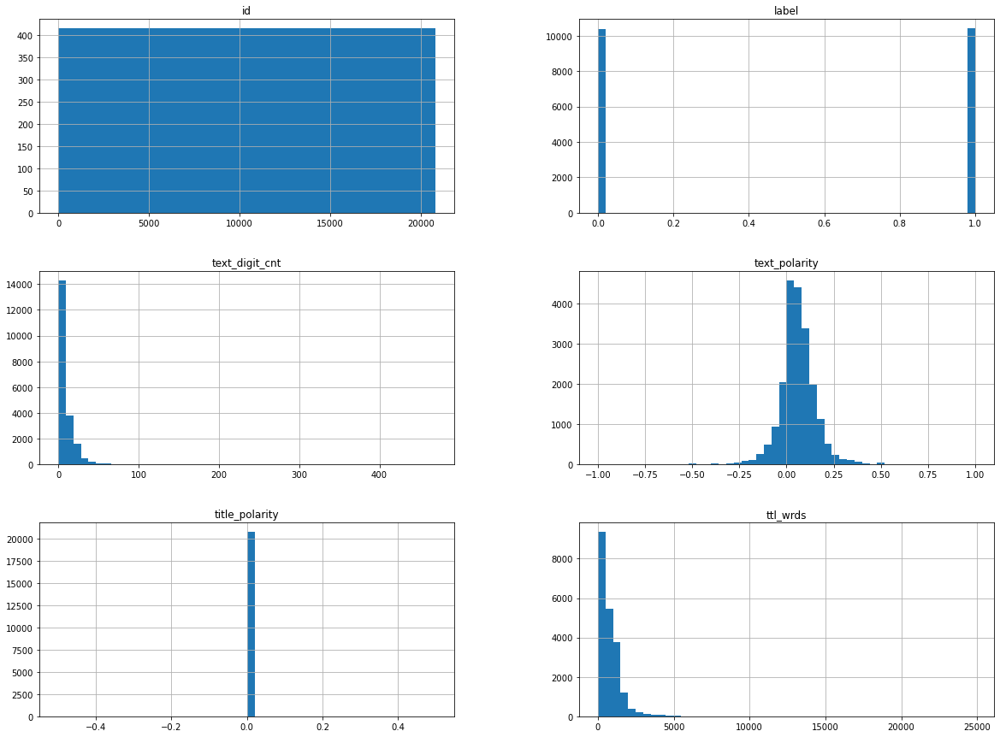

In [92]:
%matplotlib inline
train.hist(bins=50, figsize = (20,15))
plt.show()

#### Removing Columns based on data visualization
 
title_polarity has 0 variance and contributes nothing in the model

In [93]:
train.drop(['title_polarity','id'],axis=1,inplace= True)

In [94]:
test_id = test.id
test.drop(['title_polarity','id'],axis=1,inplace= True)

In [95]:
## Getting column names 

# All column names
cols = train.columns

# only numnerical columns
cols_num = train.select_dtypes([np.number]).columns

# only string columns
cols_str = train.select_dtypes(object).columns

print(cols)
print(cols_num)
print(cols_str)

Index(['title', 'author', 'text', 'label', 'original_text', 'text_words',
       'text_digit_cnt', 'clean_text_lem', 'clean_text', 'text_polarity',
       'ttl_wrds'],
      dtype='object')
Index(['label', 'text_digit_cnt', 'text_polarity', 'ttl_wrds'], dtype='object')
Index(['title', 'author', 'text', 'original_text', 'text_words',
       'clean_text_lem', 'clean_text'],
      dtype='object')


In [96]:
## Analyzing new variables distribution w.r.t. to the label varaible
print(pd.pivot_table(train, index = 'label', values = cols_num[1:],aggfunc = 'sum'))
print(pd.pivot_table(train, index = 'label', values = cols_num[1:],aggfunc = 'min'))
print(pd.pivot_table(train, index = 'label', values = cols_num[1:],aggfunc = 'max'))
print(pd.pivot_table(train, index = 'label', values = cols_num[1:],aggfunc = np.mean))

       text_digit_cnt  text_polarity  ttl_wrds
label                                         
0              108444     631.065967   9522464
1               79922     589.091514   6807367
       text_digit_cnt  text_polarity  ttl_wrds
label                                         
0                   0          -0.45         1
1                   0          -1.00         0
       text_digit_cnt  text_polarity  ttl_wrds
label                                         
0                 235           0.65     15349
1                 470           1.00     24870
       text_digit_cnt  text_polarity    ttl_wrds
label                                           
0           10.440358       0.060755  916.767498
1            7.675214       0.056573  653.737348


#### On average fake news articles have less data citations, range to extreme polarity, and are shorter than real news

This confirms the hypothesis about opinions.

## Correlations


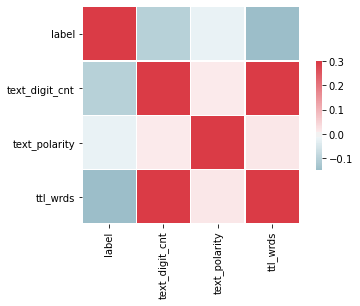

In [98]:
cmap = sb.diverging_palette(220, 10, as_cmap=True)
sb.heatmap(train[cols_num].corr(),vmax=.3, center=0, cmap=cmap,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

all three variables have some negative correlation with the label

text_digit_cnt


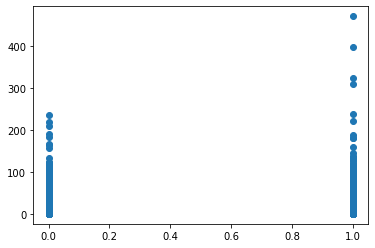

text_polarity


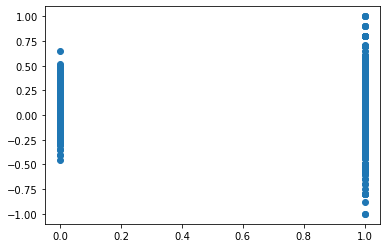

ttl_wrds


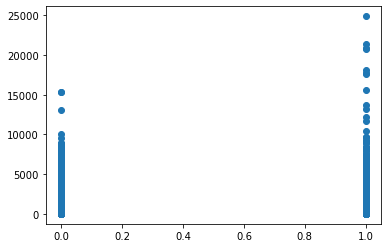

In [99]:
## Visualizing variance of these variables with label
for col in cols_num[1:]:
    print(col)
    plt.scatter(train.label,train[col])
    plt.show()

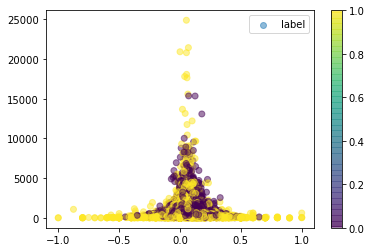

In [57]:
## text polarity and ttl_wrds have small positive correlation, check their distribution
plt.scatter(train.text_polarity,train.ttl_wrds ,c = train.label,label = 'label',alpha = 0.5)
plt.legend()
plt.colorbar()